In [48]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier


from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split


In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
dataset = pd.read_csv('LS_2.0.csv')
dataset.head()

,STATE,CONSTITUENCY,NAME,WINNER,PARTY,SYMBOL,GENDER,CRIMINAL\nCASES,AGE,CATEGORY,EDUCATION,ASSETS,LIABILITIES,GENERAL\nVOTES,POSTAL\nVOTES,TOTAL\nVOTES,OVER TOTAL ELECTORS \nIN CONSTITUENCY,OVER TOTAL VOTES POLLED \nIN CONSTITUENCY,TOTAL ELECTORS
0,Telangana,ADILABAD,SOYAM BAPU RAO,1,BJP,Lotus,MALE,52,52.0,ST,12th Pass,"Rs 30,99,414\n ~ 30 Lacs+","Rs 2,31,450\n ~ 2 Lacs+",376892,482,377374,25.330684,35.468248,1489790
1,Telangana,ADILABAD,Godam Nagesh,0,TRS,Car,MALE,0,54.0,ST,Post Graduate,"Rs 1,84,77,888\n ~ 1 Crore+","Rs 8,47,000\n ~ 8 Lacs+",318665,149,318814,21.399929,29.964370,1489790
2,Telangana,ADILABAD,RATHOD RAMESH,0,INC,Hand,MALE,3,52.0,ST,12th Pass,"Rs 3,64,91,000\n ~ 3 Crore+","Rs 1,53,00,000\n ~ 1 Crore+",314057,181,314238,21.092771,29.534285,1489790
3,Telangana,ADILABAD,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13030,6,13036,0.875023,1.225214,1489790
4,Uttar Pradesh,AGRA,Satyapal Singh Baghel,1,BJP,Lotus,MALE,5,58.0,SC,Doctorate,"Rs 7,42,74,036\n ~ 7 Crore+","Rs 86,06,522\n ~ 86 Lacs+",644459,2416,646875,33.383823,56.464615,1937690


In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2263 entries, 0 to 2262
Data columns (total 19 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   STATE                                     2263 non-null   object 
 1   CONSTITUENCY                              2263 non-null   object 
 2   NAME                                      2263 non-null   object 
 3   WINNER                                    2263 non-null   int64  
 4   PARTY                                     2263 non-null   object 
 5   SYMBOL                                    2018 non-null   object 
 6   GENDER                                    2018 non-null   object 
 7   CRIMINAL
CASES                            2018 non-null   object 
 8   AGE                                       2018 non-null   float64
 9   CATEGORY                                  2018 non-null   object 
 10  EDUCATION                           

### As we can see from the info above that there are a few column names where the names have \n in them. To remove these \n, I am renaming them

In [5]:
dataset = dataset.rename(columns={'CRIMINAL\nCASES': 'CRIMINAL_CASES', 'GENERAL\nVOTES': 'GENERAL_VOTES', 
                                  'POSTAL\nVOTES': 'POSTAL_VOTES', 'TOTAL\nVOTES': 'TOTAL_VOTES', 
                                  'OVER TOTAL ELECTORS \nIN CONSTITUENCY': 'OVER_TOTAL_ELECTORS_IN_CONSTITUENCY', 
                                  'OVER TOTAL VOTES POLLED \nIN CONSTITUENCY': 'OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY', 
                                  'TOTAL ELECTORS': 'TOTAL_ELECTORS'})

In [6]:
# revised dataset with columns without \n
dataset

,STATE,CONSTITUENCY,NAME,WINNER,PARTY,SYMBOL,GENDER,CRIMINAL_CASES,AGE,CATEGORY,EDUCATION,ASSETS,LIABILITIES,GENERAL_VOTES,POSTAL_VOTES,TOTAL_VOTES,OVER_TOTAL_ELECTORS_IN_CONSTITUENCY,OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY,TOTAL_ELECTORS
0,Telangana,ADILABAD,SOYAM BAPU RAO,1,BJP,Lotus,MALE,52,52.0,ST,12th Pass,"Rs 30,99,414\n ~ 30 Lacs+","Rs 2,31,450\n ~ 2 Lacs+",376892,482,377374,25.330684,35.468248,1489790
1,Telangana,ADILABAD,Godam Nagesh,0,TRS,Car,MALE,0,54.0,ST,Post Graduate,"Rs 1,84,77,888\n ~ 1 Crore+","Rs 8,47,000\n ~ 8 Lacs+",318665,149,318814,21.399929,29.964370,1489790
2,Telangana,ADILABAD,RATHOD RAMESH,0,INC,Hand,MALE,3,52.0,ST,12th Pass,"Rs 3,64,91,000\n ~ 3 Crore+","Rs 1,53,00,000\n ~ 1 Crore+",314057,181,314238,21.092771,29.534285,1489790
3,Telangana,ADILABAD,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13030,6,13036,0.875023,1.225214,1489790
4,Uttar Pradesh,AGRA,Satyapal Singh Baghel,1,BJP,Lotus,MALE,5,58.0,SC,Doctorate,"Rs 7,42,74,036\n ~ 7 Crore+","Rs 86,06,522\n ~ 86 Lacs+",644459,2416,646875,33.383823,56.464615,1937690
5,Uttar Pradesh,AGRA,Manoj Kumar Soni,0,BSP,Elephant,MALE,0,47.0,SC,Post Graduate,"Rs 13,37,84,385\n ~ 13 Crore+","Rs 2,22,51,891\n ~ 2 Crore+",434199,1130,435329,22.466390,37.999125,1937690
6,Uttar Pradesh,AGRA,Preeta Harit,0,INC,Hand,FEMALE,0,54.0,SC,Post Graduate,"Rs 5,50,75,753\n ~ 5 Crore+",Rs 0\n ~,44877,272,45149,2.330042,3.940979,1937690
7,Maharashtra,AHMADNAGAR,Dr. SUJAY RADHAKRISHNA VIKHEPATIL,1,BJP,Lotus,MALE,0,37.0,GENERAL,Doctorate,"Rs 16,86,64,576\n ~ 16 Crore+","Rs 26,23,964\n ~ 26 Lacs+",696961,7699,704660,37.856533,58.425159,1861396
8,Maharashtra,AHMADNAGAR,SANGRAM ARUNKAKA JAGTAP,0,NCP,Clock,MALE,1,34.0,GENERAL,Graduate,"Rs 9,44,88,381\n ~ 9 Crore+","Rs 3,25,49,132\n ~ 3 Crore+",419364,3822,423186,22.734872,35.087431,1861396
9,Maharashtra,AHMADNAGAR,SUDHAKAR LAXMAN AVHAD,0,VBA,Cup & Saucer,MALE,0,62.0,GENERAL,Graduate,"Rs 1,39,49,000\n ~ 1 Crore+","Rs 14,00,000\n ~ 14 Lacs+",31644,163,31807,1.708771,2.637200,1861396


In [7]:
dataset.isna().sum()

STATE                                        0
CONSTITUENCY                                 0
NAME                                         0
WINNER                                       0
PARTY                                        0
SYMBOL                                     245
GENDER                                     245
CRIMINAL_CASES                             245
AGE                                        245
CATEGORY                                   245
EDUCATION                                  245
ASSETS                                     245
LIABILITIES                                245
GENERAL_VOTES                                0
POSTAL_VOTES                                 0
TOTAL_VOTES                                  0
OVER_TOTAL_ELECTORS_IN_CONSTITUENCY          0
OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY      0
TOTAL_ELECTORS                               0
dtype: int64

In [8]:
dataset[dataset['AGE'].isnull()]

,STATE,CONSTITUENCY,NAME,WINNER,PARTY,SYMBOL,GENDER,CRIMINAL_CASES,AGE,CATEGORY,EDUCATION,ASSETS,LIABILITIES,GENERAL_VOTES,POSTAL_VOTES,TOTAL_VOTES,OVER_TOTAL_ELECTORS_IN_CONSTITUENCY,OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY,TOTAL_ELECTORS
3,Telangana,ADILABAD,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13030,6,13036,0.875023,1.225214,1489790
14,Gujarat,AHMEDABAD WEST,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14580,139,14719,0.895688,1.473030,1643317
39,West Bengal,ALIPURDUARS,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21147,28,21175,1.284592,1.533114,1648383
46,Uttarakhand,ALMORA,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15311,194,15505,1.158985,2.215611,1337808
54,Andhra Pradesh,AMALAPURAM,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16427,41,16468,1.128288,1.333044,1459556
62,Uttar Pradesh,AMBEDKAR NAGAR,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11329,15,11344,0.635284,1.040147,1785657
71,Gujarat,AMRELI,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17513,54,17567,1.078755,1.927383,1628451
77,Punjab,AMRITSAR,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8713,50,8763,0.581149,1.018264,1507875
84,Andhra Pradesh,ANAKAPALLI,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34877,20,34897,2.293798,2.813240,1521363
88,Gujarat,ANAND,NOTA,0,NOTA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18365,27,18392,1.110715,1.656812,1655870


### We can see that exactly 245 rows have missing values in the table. Upon checking those rows, every single one of them have NOTA as their candidate as in majority vote went to NOTA option. Therefore, I chose to delete those rows.

In [9]:
dataset = dataset[dataset['GENDER'].notna()]

In [10]:
dataset.isna().sum()

STATE                                      0
CONSTITUENCY                               0
NAME                                       0
WINNER                                     0
PARTY                                      0
SYMBOL                                     0
GENDER                                     0
CRIMINAL_CASES                             0
AGE                                        0
CATEGORY                                   0
EDUCATION                                  0
ASSETS                                     0
LIABILITIES                                0
GENERAL_VOTES                              0
POSTAL_VOTES                               0
TOTAL_VOTES                                0
OVER_TOTAL_ELECTORS_IN_CONSTITUENCY        0
OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY    0
TOTAL_ELECTORS                             0
dtype: int64

In [11]:
dataset

,STATE,CONSTITUENCY,NAME,WINNER,PARTY,SYMBOL,GENDER,CRIMINAL_CASES,AGE,CATEGORY,EDUCATION,ASSETS,LIABILITIES,GENERAL_VOTES,POSTAL_VOTES,TOTAL_VOTES,OVER_TOTAL_ELECTORS_IN_CONSTITUENCY,OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY,TOTAL_ELECTORS
0,Telangana,ADILABAD,SOYAM BAPU RAO,1,BJP,Lotus,MALE,52,52.0,ST,12th Pass,"Rs 30,99,414\n ~ 30 Lacs+","Rs 2,31,450\n ~ 2 Lacs+",376892,482,377374,25.330684,35.468248,1489790
1,Telangana,ADILABAD,Godam Nagesh,0,TRS,Car,MALE,0,54.0,ST,Post Graduate,"Rs 1,84,77,888\n ~ 1 Crore+","Rs 8,47,000\n ~ 8 Lacs+",318665,149,318814,21.399929,29.964370,1489790
2,Telangana,ADILABAD,RATHOD RAMESH,0,INC,Hand,MALE,3,52.0,ST,12th Pass,"Rs 3,64,91,000\n ~ 3 Crore+","Rs 1,53,00,000\n ~ 1 Crore+",314057,181,314238,21.092771,29.534285,1489790
4,Uttar Pradesh,AGRA,Satyapal Singh Baghel,1,BJP,Lotus,MALE,5,58.0,SC,Doctorate,"Rs 7,42,74,036\n ~ 7 Crore+","Rs 86,06,522\n ~ 86 Lacs+",644459,2416,646875,33.383823,56.464615,1937690
5,Uttar Pradesh,AGRA,Manoj Kumar Soni,0,BSP,Elephant,MALE,0,47.0,SC,Post Graduate,"Rs 13,37,84,385\n ~ 13 Crore+","Rs 2,22,51,891\n ~ 2 Crore+",434199,1130,435329,22.466390,37.999125,1937690
6,Uttar Pradesh,AGRA,Preeta Harit,0,INC,Hand,FEMALE,0,54.0,SC,Post Graduate,"Rs 5,50,75,753\n ~ 5 Crore+",Rs 0\n ~,44877,272,45149,2.330042,3.940979,1937690
7,Maharashtra,AHMADNAGAR,Dr. SUJAY RADHAKRISHNA VIKHEPATIL,1,BJP,Lotus,MALE,0,37.0,GENERAL,Doctorate,"Rs 16,86,64,576\n ~ 16 Crore+","Rs 26,23,964\n ~ 26 Lacs+",696961,7699,704660,37.856533,58.425159,1861396
8,Maharashtra,AHMADNAGAR,SANGRAM ARUNKAKA JAGTAP,0,NCP,Clock,MALE,1,34.0,GENERAL,Graduate,"Rs 9,44,88,381\n ~ 9 Crore+","Rs 3,25,49,132\n ~ 3 Crore+",419364,3822,423186,22.734872,35.087431,1861396
9,Maharashtra,AHMADNAGAR,SUDHAKAR LAXMAN AVHAD,0,VBA,Cup & Saucer,MALE,0,62.0,GENERAL,Graduate,"Rs 1,39,49,000\n ~ 1 Crore+","Rs 14,00,000\n ~ 14 Lacs+",31644,163,31807,1.708771,2.637200,1861396
10,Gujarat,AHMEDABAD EAST,Patel Hasmukhbhai Somabhai,1,BJP,Lotus,MALE,0,58.0,GENERAL,Others,"Rs 7,46,99,690\n ~ 7 Crore+","Rs 62,52,577\n ~ 62 Lacs+",745810,4024,749834,41.384970,67.005462,1811851


In [12]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2018 entries, 0 to 2261
Data columns (total 19 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   STATE                                    2018 non-null   object 
 1   CONSTITUENCY                             2018 non-null   object 
 2   NAME                                     2018 non-null   object 
 3   WINNER                                   2018 non-null   int64  
 4   PARTY                                    2018 non-null   object 
 5   SYMBOL                                   2018 non-null   object 
 6   GENDER                                   2018 non-null   object 
 7   CRIMINAL_CASES                           2018 non-null   object 
 8   AGE                                      2018 non-null   float64
 9   CATEGORY                                 2018 non-null   object 
 10  EDUCATION                                2018 no

#### Let’s convert ASSETS, LIABILITIES and CRIMINAL_CASES columns into numeric values because they represent money and count, and numeric values will make sense for these columns. In order to do that, we have to remove the ‘Rs’ sign, ‘\n’ character and commas in each value field.

In [13]:
dataset['ASSETS'] = dataset['ASSETS'].map(lambda x: x.lstrip('Rs ').split('\n')[0].replace(',', ''))

C:\Users\User\AppData\Local\Temp/ipykernel_25392/1027804781.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['ASSETS'] = dataset['ASSETS'].map(lambda x: x.lstrip('Rs ').split('\n')[0].replace(',', ''))


In [14]:
dataset['LIABILITIES'] = dataset['LIABILITIES'].map(lambda x: x.lstrip('Rs ').split('\n')[0].replace(',', ''))

C:\Users\User\AppData\Local\Temp/ipykernel_25392/3587311213.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['LIABILITIES'] = dataset['LIABILITIES'].map(lambda x: x.lstrip('Rs ').split('\n')[0].replace(',', ''))


In [15]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2018 entries, 0 to 2261
Data columns (total 19 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   STATE                                    2018 non-null   object 
 1   CONSTITUENCY                             2018 non-null   object 
 2   NAME                                     2018 non-null   object 
 3   WINNER                                   2018 non-null   int64  
 4   PARTY                                    2018 non-null   object 
 5   SYMBOL                                   2018 non-null   object 
 6   GENDER                                   2018 non-null   object 
 7   CRIMINAL_CASES                           2018 non-null   object 
 8   AGE                                      2018 non-null   float64
 9   CATEGORY                                 2018 non-null   object 
 10  EDUCATION                                2018 no

In [16]:
dataset[(dataset['ASSETS']=='Nil') | (dataset['ASSETS']=='Not Available') | (dataset['ASSETS']=='`')]

,STATE,CONSTITUENCY,NAME,WINNER,PARTY,SYMBOL,GENDER,CRIMINAL_CASES,AGE,CATEGORY,EDUCATION,ASSETS,LIABILITIES,GENERAL_VOTES,POSTAL_VOTES,TOTAL_VOTES,OVER_TOTAL_ELECTORS_IN_CONSTITUENCY,OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY,TOTAL_ELECTORS
413,Telangana,BHONGIR,Singapaka Lingam,0,IND,Road Roller,MALE,0,44.0,SC,Illiterate,Nil,0,27973,0,27973,1.718208,2.306525,1628033
468,Bihar,BUXAR,Ramchandra Singh Yadav,0,IND,Almirah,MALE,Not Available,42.0,GENERAL,Not Available,Not Available,Not Available,10721,9,10730,0.586540,1.087175,1829373
532,Tamil Nadu,CHIDAMBARAM,SIVAJOTHI M,0,NTK,Ganna Kisan,MALE,Not Available,35.0,SC,Not Available,Not Available,Not Available,37329,142,37471,2.531445,3.246331,1480222
585,Gujarat,DAHOD,DEVDHA SAMSUBHAI KHATARABHAI,0,IND,Boat with Man and Sail,MALE,0,51.0,ST,Graduate Professional,Nil,0,11135,7,11142,0.696837,1.046796,1598939
612,Uttar Pradesh,DEORIA,BINOD KUMAR JAISWAL,0,BSP,Elephant,MALE,Not Available,56.0,GENERAL,Not Available,Not Available,Not Available,327728,2985,330713,18.852693,32.563441,1754195
613,Uttar Pradesh,DEORIA,NIYAZ AHMED,0,INC,Hand,MALE,Not Available,57.0,GENERAL,Not Available,Not Available,Not Available,50749,307,51056,2.910509,5.027196,1754195
654,Tamil Nadu,DINDIGUL,"JOTHIMUTHU, K.",0,PMK,Mango,MALE,Not Available,48.0,GENERAL,Not Available,Not Available,Not Available,206782,769,207551,13.460896,17.877979,1541881
656,Tamil Nadu,DINDIGUL,"MANSOORALI KHAN, A.",0,NTK,Ganna Kisan,MALE,Not Available,56.0,GENERAL,Not Available,Not Available,Not Available,54574,383,54957,3.564283,4.733873,1541881
688,Andhra Pradesh,ELURU,PENTAPATI PULLARAO,0,JnP,Glass Tumbler,MALE,Not Available,71.0,GENERAL,Not Available,Not Available,Not Available,76481,346,76827,4.816891,5.766884,1594950
972,Bihar,JAMUI (SC),UPENDRA RAVIDAS,0,BSP,Elephant,MALE,Not Available,40.0,SC,Not Available,Not Available,Not Available,31504,107,31611,1.839117,3.329012,1718814


### There are no values in Assets with value '0'. So I am converting 'Nil', '~' and 'Not Available' values to 0 for identifying. Next I will convert these '0' values to float. And then I'll replace these '0' values by the mean 'Asset' value.

In [17]:
dataset['ASSETS'] = dataset['ASSETS'].replace(['Nil', '`', 'Not Available'], '0')

C:\Users\User\AppData\Local\Temp/ipykernel_25392/3090373289.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['ASSETS'] = dataset['ASSETS'].replace(['Nil', '`', 'Not Available'], '0')


In [18]:
dataset['ASSETS'] = dataset['ASSETS'].astype(str).astype(float)

C:\Users\User\AppData\Local\Temp/ipykernel_25392/183483877.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['ASSETS'] = dataset['ASSETS'].astype(str).astype(float)


In [19]:
dataset['ASSETS'] = dataset['ASSETS'].replace([0], dataset['ASSETS'].mean())

C:\Users\User\AppData\Local\Temp/ipykernel_25392/1212441129.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['ASSETS'] = dataset['ASSETS'].replace([0], dataset['ASSETS'].mean())


### Since Liabilities has '0' values, we cant convert the 'Nil' and 'Not Available' values to 0 as that will create confusion. So instead I'' convert them to np.NaN. Then these np.NaN values will be converted to float from string. Finally these np.NaN values will replaced the mean LIABILITIES values.

In [20]:
dataset[(dataset['LIABILITIES']=='Nil') | (dataset['LIABILITIES']=='Not Available')]

,STATE,CONSTITUENCY,NAME,WINNER,PARTY,SYMBOL,GENDER,CRIMINAL_CASES,AGE,CATEGORY,EDUCATION,ASSETS,LIABILITIES,GENERAL_VOTES,POSTAL_VOTES,TOTAL_VOTES,OVER_TOTAL_ELECTORS_IN_CONSTITUENCY,OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY,TOTAL_ELECTORS
468,Bihar,BUXAR,Ramchandra Singh Yadav,0,IND,Almirah,MALE,Not Available,42.0,GENERAL,Not Available,1.315849e+08,Not Available,10721,9,10730,0.586540,1.087175,1829373
532,Tamil Nadu,CHIDAMBARAM,SIVAJOTHI M,0,NTK,Ganna Kisan,MALE,Not Available,35.0,SC,Not Available,1.315849e+08,Not Available,37329,142,37471,2.531445,3.246331,1480222
612,Uttar Pradesh,DEORIA,BINOD KUMAR JAISWAL,0,BSP,Elephant,MALE,Not Available,56.0,GENERAL,Not Available,1.315849e+08,Not Available,327728,2985,330713,18.852693,32.563441,1754195
613,Uttar Pradesh,DEORIA,NIYAZ AHMED,0,INC,Hand,MALE,Not Available,57.0,GENERAL,Not Available,1.315849e+08,Not Available,50749,307,51056,2.910509,5.027196,1754195
654,Tamil Nadu,DINDIGUL,"JOTHIMUTHU, K.",0,PMK,Mango,MALE,Not Available,48.0,GENERAL,Not Available,1.315849e+08,Not Available,206782,769,207551,13.460896,17.877979,1541881
656,Tamil Nadu,DINDIGUL,"MANSOORALI KHAN, A.",0,NTK,Ganna Kisan,MALE,Not Available,56.0,GENERAL,Not Available,1.315849e+08,Not Available,54574,383,54957,3.564283,4.733873,1541881
688,Andhra Pradesh,ELURU,PENTAPATI PULLARAO,0,JnP,Glass Tumbler,MALE,Not Available,71.0,GENERAL,Not Available,1.315849e+08,Not Available,76481,346,76827,4.816891,5.766884,1594950
972,Bihar,JAMUI (SC),UPENDRA RAVIDAS,0,BSP,Elephant,MALE,Not Available,40.0,SC,Not Available,1.315849e+08,Not Available,31504,107,31611,1.839117,3.329012,1718814
1033,Uttar Pradesh,KAISERGANJ,Vinay Kumar Pandey 'Vinnu',0,INC,Hand,MALE,Not Available,54.0,GENERAL,Not Available,1.315849e+08,Not Available,37049,83,37132,2.056097,3.780019,1805946
1052,Tamil Nadu,KALLAKURICHI,Sharfudeen S,0,NTK,Ganna Kisan,MALE,Not Available,40.0,GENERAL,Not Available,1.315849e+08,Not Available,30103,143,30246,1.978236,2.510177,1528938


In [21]:
dataset['LIABILITIES'] = dataset['LIABILITIES'].replace(['NIL', 'Not Available'], np.NaN)

C:\Users\User\AppData\Local\Temp/ipykernel_25392/956445990.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['LIABILITIES'] = dataset['LIABILITIES'].replace(['NIL', 'Not Available'], np.NaN)


In [22]:
dataset['LIABILITIES'] = dataset['LIABILITIES'].astype(str).astype(float)

C:\Users\User\AppData\Local\Temp/ipykernel_25392/2396103060.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['LIABILITIES'] = dataset['LIABILITIES'].astype(str).astype(float)


In [23]:
dataset['LIABILITIES'] = dataset['LIABILITIES'].replace(np.NaN, dataset['LIABILITIES'].mean())

C:\Users\User\AppData\Local\Temp/ipykernel_25392/1669680566.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['LIABILITIES'] = dataset['LIABILITIES'].replace(np.NaN, dataset['LIABILITIES'].mean())


### Converting the 'Not Available' CRIMINAL_CASES values to '0' and then converting them to integers.

In [24]:
dataset['CRIMINAL_CASES'] = dataset['CRIMINAL_CASES'].replace(['Not Available'], np.NaN)

C:\Users\User\AppData\Local\Temp/ipykernel_25392/808159655.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['CRIMINAL_CASES'] = dataset['CRIMINAL_CASES'].replace(['Not Available'], np.NaN)


In [25]:
dataset['CRIMINAL_CASES'] = dataset['CRIMINAL_CASES'].astype(str).astype(float)

C:\Users\User\AppData\Local\Temp/ipykernel_25392/1425170790.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['CRIMINAL_CASES'] = dataset['CRIMINAL_CASES'].astype(str).astype(float)


In [26]:
dataset['CRIMINAL_CASES'] = dataset['CRIMINAL_CASES'].replace(np.NaN, 0.0)

C:\Users\User\AppData\Local\Temp/ipykernel_25392/1702093442.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['CRIMINAL_CASES'] = dataset['CRIMINAL_CASES'].replace(np.NaN, 0.0)


In [27]:
dataset['CRIMINAL_CASES'] = dataset['CRIMINAL_CASES'].astype(float).astype(int)

C:\Users\User\AppData\Local\Temp/ipykernel_25392/885230089.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['CRIMINAL_CASES'] = dataset['CRIMINAL_CASES'].astype(float).astype(int)


In [28]:
dataset

,STATE,CONSTITUENCY,NAME,WINNER,PARTY,SYMBOL,GENDER,CRIMINAL_CASES,AGE,CATEGORY,EDUCATION,ASSETS,LIABILITIES,GENERAL_VOTES,POSTAL_VOTES,TOTAL_VOTES,OVER_TOTAL_ELECTORS_IN_CONSTITUENCY,OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY,TOTAL_ELECTORS
0,Telangana,ADILABAD,SOYAM BAPU RAO,1,BJP,Lotus,MALE,52,52.0,ST,12th Pass,3.099414e+06,2.314500e+05,376892,482,377374,25.330684,35.468248,1489790
1,Telangana,ADILABAD,Godam Nagesh,0,TRS,Car,MALE,0,54.0,ST,Post Graduate,1.847789e+07,8.470000e+05,318665,149,318814,21.399929,29.964370,1489790
2,Telangana,ADILABAD,RATHOD RAMESH,0,INC,Hand,MALE,3,52.0,ST,12th Pass,3.649100e+07,1.530000e+07,314057,181,314238,21.092771,29.534285,1489790
4,Uttar Pradesh,AGRA,Satyapal Singh Baghel,1,BJP,Lotus,MALE,5,58.0,SC,Doctorate,7.427404e+07,8.606522e+06,644459,2416,646875,33.383823,56.464615,1937690
5,Uttar Pradesh,AGRA,Manoj Kumar Soni,0,BSP,Elephant,MALE,0,47.0,SC,Post Graduate,1.337844e+08,2.225189e+07,434199,1130,435329,22.466390,37.999125,1937690
6,Uttar Pradesh,AGRA,Preeta Harit,0,INC,Hand,FEMALE,0,54.0,SC,Post Graduate,5.507575e+07,0.000000e+00,44877,272,45149,2.330042,3.940979,1937690
7,Maharashtra,AHMADNAGAR,Dr. SUJAY RADHAKRISHNA VIKHEPATIL,1,BJP,Lotus,MALE,0,37.0,GENERAL,Doctorate,1.686646e+08,2.623964e+06,696961,7699,704660,37.856533,58.425159,1861396
8,Maharashtra,AHMADNAGAR,SANGRAM ARUNKAKA JAGTAP,0,NCP,Clock,MALE,1,34.0,GENERAL,Graduate,9.448838e+07,3.254913e+07,419364,3822,423186,22.734872,35.087431,1861396
9,Maharashtra,AHMADNAGAR,SUDHAKAR LAXMAN AVHAD,0,VBA,Cup & Saucer,MALE,0,62.0,GENERAL,Graduate,1.394900e+07,1.400000e+06,31644,163,31807,1.708771,2.637200,1861396
10,Gujarat,AHMEDABAD EAST,Patel Hasmukhbhai Somabhai,1,BJP,Lotus,MALE,0,58.0,GENERAL,Others,7.469969e+07,6.252577e+06,745810,4024,749834,41.384970,67.005462,1811851


### Since education column is ordinal where each value is higher or lower than the other one, I am mapping a number to each value. Note that there is a field value named as “Other”, which we don’t know the hierarchical position. I just assign a median value from the range for it.

In [29]:
dataset['EDUCATION'].value_counts()

Post Graduate            502
Graduate                 441
Graduate Professional    336
12th Pass                256
10th Pass                196
8th Pass                  78
Doctorate                 73
Others                    50
Literate                  30
5th Pass                  28
Not Available             22
Illiterate                 5
Post Graduate\n            1
Name: EDUCATION, dtype: int64

In [30]:
# encode education column
encoded_edu = []
# iterate through each row in the dataset
for row in dataset.itertuples():
    education = row.EDUCATION
    if education == "Illiterate":
        encoded_edu.append(0)
    elif education == "Literate":
        encoded_edu.append(1)
    elif education == "5th Pass":
        encoded_edu.append(2)
    elif education == "8th Pass":
        encoded_edu.append(3)
    elif education == "10th Pass":
        encoded_edu.append(4)
    elif education == "12th Pass":
        encoded_edu.append(7)
    elif education == "Graduate":
        encoded_edu.append(8)
    elif education == "Post Graduate":
        encoded_edu.append(9)
    elif education == "Graduate Professional":
        encoded_edu.append(10)
    elif education == "Doctorate":
        encoded_edu.append(11)
    else:
        encoded_edu.append(5)
dataset['EDUCATION'] = encoded_edu

C:\Users\User\AppData\Local\Temp/ipykernel_25392/177741544.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['EDUCATION'] = encoded_edu


In [31]:
dataset

,STATE,CONSTITUENCY,NAME,WINNER,PARTY,SYMBOL,GENDER,CRIMINAL_CASES,AGE,CATEGORY,EDUCATION,ASSETS,LIABILITIES,GENERAL_VOTES,POSTAL_VOTES,TOTAL_VOTES,OVER_TOTAL_ELECTORS_IN_CONSTITUENCY,OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY,TOTAL_ELECTORS
0,Telangana,ADILABAD,SOYAM BAPU RAO,1,BJP,Lotus,MALE,52,52.0,ST,7,3.099414e+06,2.314500e+05,376892,482,377374,25.330684,35.468248,1489790
1,Telangana,ADILABAD,Godam Nagesh,0,TRS,Car,MALE,0,54.0,ST,9,1.847789e+07,8.470000e+05,318665,149,318814,21.399929,29.964370,1489790
2,Telangana,ADILABAD,RATHOD RAMESH,0,INC,Hand,MALE,3,52.0,ST,7,3.649100e+07,1.530000e+07,314057,181,314238,21.092771,29.534285,1489790
4,Uttar Pradesh,AGRA,Satyapal Singh Baghel,1,BJP,Lotus,MALE,5,58.0,SC,11,7.427404e+07,8.606522e+06,644459,2416,646875,33.383823,56.464615,1937690
5,Uttar Pradesh,AGRA,Manoj Kumar Soni,0,BSP,Elephant,MALE,0,47.0,SC,9,1.337844e+08,2.225189e+07,434199,1130,435329,22.466390,37.999125,1937690
6,Uttar Pradesh,AGRA,Preeta Harit,0,INC,Hand,FEMALE,0,54.0,SC,9,5.507575e+07,0.000000e+00,44877,272,45149,2.330042,3.940979,1937690
7,Maharashtra,AHMADNAGAR,Dr. SUJAY RADHAKRISHNA VIKHEPATIL,1,BJP,Lotus,MALE,0,37.0,GENERAL,11,1.686646e+08,2.623964e+06,696961,7699,704660,37.856533,58.425159,1861396
8,Maharashtra,AHMADNAGAR,SANGRAM ARUNKAKA JAGTAP,0,NCP,Clock,MALE,1,34.0,GENERAL,8,9.448838e+07,3.254913e+07,419364,3822,423186,22.734872,35.087431,1861396
9,Maharashtra,AHMADNAGAR,SUDHAKAR LAXMAN AVHAD,0,VBA,Cup & Saucer,MALE,0,62.0,GENERAL,8,1.394900e+07,1.400000e+06,31644,163,31807,1.708771,2.637200,1861396
10,Gujarat,AHMEDABAD EAST,Patel Hasmukhbhai Somabhai,1,BJP,Lotus,MALE,0,58.0,GENERAL,5,7.469969e+07,6.252577e+06,745810,4024,749834,41.384970,67.005462,1811851


#### Let’s have some analysis of the PARTY column. If we list the number of candidates in front of each party, we can see that only a few parties have a significant number of candidates. The whole purpose of including the PARTY column is to have the impact of party of the candidate for the winning of the election. If the party doesn’t have a significant number of candidates, impact of that party for the winning of the candidate is low. So we can encode all of them into one common category (I encoded them as “other”).

In [32]:
dataset['PARTY'].value_counts()

BJP           420
INC           413
IND           201
BSP           163
CPI(M)        100
VBA            47
AITC           47
SP             39
NTK            38
MNM            36
SHS            26
TDP            25
AAP            25
YSRCP          25
DMK            23
RJD            21
NCP            21
AIADMK         21
BJD            21
JnP            20
JD(U)          18
TRS            17
SBSP           10
SAD            10
APoI            9
JD(S)           9
PMK             7
LJP             6
JNJP            6
CPI(ML)(L)      6
NPEP            5
BMUP            5
BLSP            5
JMM             5
GGP             5
RSP             5
DMDK            4
SDPI            4
INLD            4
BDJS            4
BTP             4
AGP             3
RSPSR           3
JKN             3
VSIP            3
PUNEKP          3
JPC             3
AIUDF           3
SSD             3
IUML            3
PSPL            3
RLD             3
LIP             3
PPID            3
RAHIS           3
HAMS      

In [33]:
# change party of the less frequent parties as Other
# 'BJP','INC','IND','BSP', 'CPI(M)', 'AITC', 'MNM': high frequent
# 'TDP', 'VSRCP', 'SP', 'DMK', 'BJD': medium frequent
dataset.loc[~dataset["PARTY"].isin(['BJP','INC','IND','BSP', 'CPI(M)', 'VBA', 'AITC', 'SP', 'NTK', 'MNM', 'SHS', 'TDP', 'AAP','YSRCP', 'DMK', 'RJD', 'NCP','AIDMK', 'BJD', 'JnP']), "PARTY"] = "Other"
dataset['PARTY'].value_counts()

C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


BJP       420
INC       413
Other     307
IND       201
BSP       163
CPI(M)    100
VBA        47
AITC       47
SP         39
NTK        38
MNM        36
SHS        26
AAP        25
TDP        25
YSRCP      25
DMK        23
NCP        21
RJD        21
BJD        21
JnP        20
Name: PARTY, dtype: int64

### Now let’s make non-numeric columns numeric for better performance. Note that some model types cannot perform with non-numerical data. Here I’m focusing on a classification algorithm, which certainly cannot train on non-numerical data. So I label encoded those non-numerical columns using sklearn LabelEncoder.

In [39]:
lblEncoder_state = LabelEncoder()
lblEncoder_state.fit(dataset['STATE'])
dataset['STATE'] = lblEncoder_state.transform(dataset['STATE'])

lblEncoder_cons = LabelEncoder()
lblEncoder_cons.fit(dataset['CONSTITUENCY'])
dataset['CONSTITUENCY'] = lblEncoder_cons.transform(dataset['CONSTITUENCY'])

lblEncoder_party = LabelEncoder()
lblEncoder_party.fit(dataset['PARTY'])
dataset['PARTY'] = lblEncoder_party.transform(dataset['PARTY'])


C:\Users\User\AppData\Local\Temp/ipykernel_25392/3245483490.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['STATE'] = lblEncoder_state.transform(dataset['STATE'])
C:\Users\User\AppData\Local\Temp/ipykernel_25392/3245483490.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['CONSTITUENCY'] = lblEncoder_cons.transform(dataset['CONSTITUENCY'])
C:\Users\User\AppData\Local\Temp/ipykernel_25392/3245483490.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a

### For 'Gender' and 'Category', I am using one hot-encoding

In [40]:
dummies=pd.concat([pd.get_dummies(dataset['GENDER']),
                   pd.get_dummies(dataset['CATEGORY'])],axis=1)

In [41]:
dummies

,FEMALE,MALE,GENERAL,SC,ST
0,0,1,0,0,1
1,0,1,0,0,1
2,0,1,0,0,1
4,0,1,0,1,0
5,0,1,0,1,0
6,1,0,0,1,0
7,0,1,1,0,0
8,0,1,1,0,0
9,0,1,1,0,0
10,0,1,1,0,0


In [42]:
dataset=pd.concat([dataset,dummies],axis=1)
dataset.drop(['GENDER','CATEGORY'],axis=1,inplace=True)
dataset

,STATE,CONSTITUENCY,NAME,WINNER,PARTY,SYMBOL,CRIMINAL_CASES,AGE,EDUCATION,ASSETS,LIABILITIES,GENERAL_VOTES,POSTAL_VOTES,TOTAL_VOTES,OVER_TOTAL_ELECTORS_IN_CONSTITUENCY,OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY,TOTAL_ELECTORS,FEMALE,MALE,GENERAL,SC,ST
0,31,0,SOYAM BAPU RAO,1,3,Lotus,52,52.0,7,3.099414e+06,2.314500e+05,376892,482,377374,25.330684,35.468248,1489790,0,1,0,0,1
1,31,0,Godam Nagesh,0,13,Car,0,54.0,9,1.847789e+07,8.470000e+05,318665,149,318814,21.399929,29.964370,1489790,0,1,0,0,1
2,31,0,RATHOD RAMESH,0,7,Hand,3,52.0,7,3.649100e+07,1.530000e+07,314057,181,314238,21.092771,29.534285,1489790,0,1,0,0,1
4,33,1,Satyapal Singh Baghel,1,3,Lotus,5,58.0,11,7.427404e+07,8.606522e+06,644459,2416,646875,33.383823,56.464615,1937690,0,1,0,1,0
5,33,1,Manoj Kumar Soni,0,4,Elephant,0,47.0,9,1.337844e+08,2.225189e+07,434199,1130,435329,22.466390,37.999125,1937690,0,1,0,1,0
6,33,1,Preeta Harit,0,7,Hand,0,54.0,9,5.507575e+07,0.000000e+00,44877,272,45149,2.330042,3.940979,1937690,1,0,0,1,0
7,19,2,Dr. SUJAY RADHAKRISHNA VIKHEPATIL,1,3,Lotus,0,37.0,11,1.686646e+08,2.623964e+06,696961,7699,704660,37.856533,58.425159,1861396,0,1,1,0,0
8,19,2,SANGRAM ARUNKAKA JAGTAP,0,11,Clock,1,34.0,8,9.448838e+07,3.254913e+07,419364,3822,423186,22.734872,35.087431,1861396,0,1,1,0,0
9,19,2,SUDHAKAR LAXMAN AVHAD,0,18,Cup & Saucer,0,62.0,8,1.394900e+07,1.400000e+06,31644,163,31807,1.708771,2.637200,1861396,0,1,1,0,0
10,10,3,Patel Hasmukhbhai Somabhai,1,3,Lotus,0,58.0,5,7.469969e+07,6.252577e+06,745810,4024,749834,41.384970,67.005462,1811851,0,1,1,0,0


### Dividing the dataset into features and target variable.  First, we can remove some features by just analyzing their contribution. The NAME column won’t make any useful inferences for the model, because ideally, the name should be unique. However, the surname can be important in some cases, because some family names might have an impact on winning an election. Also the PARTY and SYMBOL both variables will represent the same feature, and we will be able to remove one of them without any impact on the accuracy. TOTAL_VOTES column contains the sum of GENERAL_VOTES column and POSTAL_VOTES column. So we can remove those two as well. If we plot the heat map representing the correlation matrix, we will see that those 3 features will be highly correlated.

In [43]:
y = dataset["WINNER"]
X = dataset.drop(labels=["WINNER"], axis=1)

In [45]:
X.drop(labels=["NAME"], axis=1, inplace=True)
X.drop(labels=["SYMBOL"], axis=1, inplace=True)
X.drop(labels=["POSTAL_VOTES"], axis=1, inplace=True)
X.drop(labels=["GENERAL_VOTES"], axis=1, inplace=True)

In [46]:
X

,STATE,CONSTITUENCY,PARTY,CRIMINAL_CASES,AGE,EDUCATION,ASSETS,LIABILITIES,TOTAL_VOTES,OVER_TOTAL_ELECTORS_IN_CONSTITUENCY,OVER_TOTAL_VOTES_POLLED_IN_CONSTITUENCY,TOTAL_ELECTORS,FEMALE,MALE,GENERAL,SC,ST
0,31,0,3,52,52.0,7,3.099414e+06,2.314500e+05,377374,25.330684,35.468248,1489790,0,1,0,0,1
1,31,0,13,0,54.0,9,1.847789e+07,8.470000e+05,318814,21.399929,29.964370,1489790,0,1,0,0,1
2,31,0,7,3,52.0,7,3.649100e+07,1.530000e+07,314238,21.092771,29.534285,1489790,0,1,0,0,1
4,33,1,3,5,58.0,11,7.427404e+07,8.606522e+06,646875,33.383823,56.464615,1937690,0,1,0,1,0
5,33,1,4,0,47.0,9,1.337844e+08,2.225189e+07,435329,22.466390,37.999125,1937690,0,1,0,1,0
6,33,1,7,0,54.0,9,5.507575e+07,0.000000e+00,45149,2.330042,3.940979,1937690,1,0,0,1,0
7,19,2,3,0,37.0,11,1.686646e+08,2.623964e+06,704660,37.856533,58.425159,1861396,0,1,1,0,0
8,19,2,11,1,34.0,8,9.448838e+07,3.254913e+07,423186,22.734872,35.087431,1861396,0,1,1,0,0
9,19,2,18,0,62.0,8,1.394900e+07,1.400000e+06,31807,1.708771,2.637200,1861396,0,1,1,0,0
10,10,3,3,0,58.0,5,7.469969e+07,6.252577e+06,749834,41.384970,67.005462,1811851,0,1,1,0,0


### Normalizing the feature dataset

In [51]:

scaler = MinMaxScaler(feature_range=(0, 1))
X=pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

### Splitting into training and test data. Finally I plotted a graph of Accuracy vs K neighbours. It's showing Accuracy is highest for K=5

In [72]:
# split dataset into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, stratify=y)
# train and test knn model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
knn.predict(X_test)
print("Testing Accuracy is: ", knn.score(X_test, y_test)*100, "%")

Testing Accuracy is:  91.83168316831683 %


In [73]:
score=[]
k=np.arange(1,25)
for n in k:
    knn = KNeighborsClassifier(n)
    knn.fit(X_train, y_train)
    knn.predict(X_test)
    score.append(knn.score(X_test, y_test)*100)

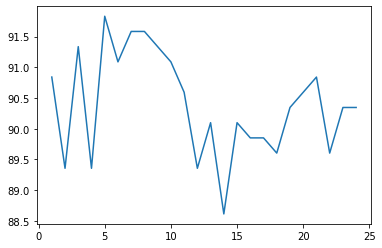

In [74]:
plt.plot(k, np.array(score))
plt.show()